In [120]:
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import warnings

In [121]:
warnings.filterwarnings("ignore")

In [17]:
data = pd.read_csv("data_hakaton1.csv", index_col=0)
data

,Product_Name,Product_Cost,Manufacture_Date,Expiry_Date,SKU,Store_Name,Store_Address,Region,Sale_Date,Quantity_Sold,Product_Amount,Product_Measure,Product_Volume,Manufacturer
0,Сливочное масло,655.20,2023-05-09 13:42:32,2023-07-08 13:42:32,1039,Натур продукт,"ул. Пушкинская, 5",Санкт-Петербург,2023-05-10 13:42:32,3.0000,600.0000,г,0.0006,"Маслозавод ""Сливка"""
1,Свинина,482.17,2020-08-23 13:57:40,2020-08-26 13:57:40,1036,Эко угол,"ул. Гагарина, 12",Воронеж,2020-08-23 13:57:40,1.4194,1.4194,кг,0.0017,"Агроконцерн ""ЭкоПоляна"""
2,Сливочное масло,190.70,2021-09-20 11:36:09,2021-11-19 11:36:09,1040,Эко центр,"ул. Горького, 2",Воронеж,2021-09-23 11:36:09,1.0000,180.0000,г,0.0002,"ОАО ""Молокозавод №1"""
3,Масло,128.70,2021-02-23 13:41:11,2021-03-25 13:41:11,1019,Натуральный магазин,"ул. Лесная, 14",Санкт-Петербург,2021-03-15 13:41:11,1.0000,1.0000,л,0.0010,"Агроконцерн ""ЭкоПоляна"""
4,Молоко,79.90,2022-02-16 11:14:41,2022-02-21 11:14:41,1003,Натуральный мир,"ул. Пушкинская, 77",Санкт-Петербург,2022-02-19 11:14:41,1.0000,0.9300,л,0.0010,"ОАО ""Молокозавод №1"""
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,Курица,344.61,2023-06-04 09:34:22,2023-06-09 09:34:22,1030,Органическая лавка,"ул. Лермонтова, 13",Москва,2023-06-05 09:34:22,1.4317,1.4317,кг,0.0017,"Птицефабрика ""Курочка"""
999996,Рис,115.20,2022-02-20 18:42:38,2023-02-20 18:42:38,1028,Фермерский рынок,"ул. Жукова, 11",Ростов-на-Дону,2022-08-29 18:42:38,2.0000,1.8000,кг,0.0022,"Агроконцерн ""ЭкоПоляна"""
999997,Хлеб,61.80,2020-05-30 14:44:04,2020-06-06 14:44:04,1015,Здоровый выбор,"ул. Рабочая, 15",Тверь,2020-06-03 14:44:04,2.0000,1000.0000,г,0.0018,"Пекарня ""Хлебушек"""
999998,Сливочное масло,274.14,2022-02-24 16:04:13,2022-04-25 16:04:13,1040,Эко ферма,"ул. Маяковского, 18",Воронеж,2022-04-04 16:04:13,1.3714,1.3714,кг,0.0014,"Агроконцерн ""ЭкоПоляна"""


In [399]:
data[(data.Region == "Ростов-на-Дону") & (data.Product_Name == "Молоко")].to_csv("dataRostovMilk.csv")

In [18]:
data['Manufacture_Date'] = pd.to_datetime(data['Manufacture_Date']) + pd.Timedelta(days=365)
data['Expiry_Date'] = pd.to_datetime(data['Expiry_Date']) + pd.Timedelta(days=365)
data['Sale_Date'] = pd.to_datetime(data['Sale_Date']) + pd.Timedelta(days=365)

In [19]:
data['Expired_days'] = (data['Expiry_Date'] - data['Sale_Date']).dt.days
data['days2sale'] = (data['Sale_Date'] - data['Manufacture_Date']).dt.days

In [20]:
data.groupby(['Store_Address', 'Region']).count()

,,Product_Name,Product_Cost,Manufacture_Date,Expiry_Date,SKU,Store_Name,Sale_Date,Quantity_Sold,Product_Amount,Product_Measure,Product_Volume,Manufacturer,Expired_days,days2sale
Store_Address,Region,,,,,,,,,,,,,,
"пр. Мира, 60",Воронеж,33382,33382,33382,33382,33382,33382,33382,33382,33382,33382,33382,33382,33382,33382
"пр. Невский, 45",Санкт-Петербург,33321,33321,33321,33321,33321,33321,33321,33321,33321,33321,33321,33321,33321,33321
"ул. Гагарина, 12",Воронеж,33303,33303,33303,33303,33303,33303,33303,33303,33303,33303,33303,33303,33303,33303
"ул. Гагарина, 28",Ростов-на-Дону,33272,33272,33272,33272,33272,33272,33272,33272,33272,33272,33272,33272,33272,33272
"ул. Горького, 15",Тверь,33252,33252,33252,33252,33252,33252,33252,33252,33252,33252,33252,33252,33252,33252
"ул. Горького, 2",Воронеж,33060,33060,33060,33060,33060,33060,33060,33060,33060,33060,33060,33060,33060,33060
"ул. Жукова, 11",Ростов-на-Дону,33343,33343,33343,33343,33343,33343,33343,33343,33343,33343,33343,33343,33343,33343
"ул. Кирова, 63",Краснодар,33703,33703,33703,33703,33703,33703,33703,33703,33703,33703,33703,33703,33703,33703
"ул. Космонавтов, 12",Краснодар,33381,33381,33381,33381,33381,33381,33381,33381,33381,33381,33381,33381,33381,33381


In [21]:
data[['Store_Address', 'Region', 'Expired_days']].groupby(['Store_Address', 'Region']).min()

,,Expired_days
Store_Address,Region,
"пр. Мира, 60",Воронеж,1
"пр. Невский, 45",Санкт-Петербург,1
"ул. Гагарина, 12",Воронеж,1
"ул. Гагарина, 28",Ростов-на-Дону,1
"ул. Горького, 15",Тверь,1
"ул. Горького, 2",Воронеж,1
"ул. Жукова, 11",Ростов-на-Дону,1
"ул. Кирова, 63",Краснодар,1
"ул. Космонавтов, 12",Краснодар,1


In [22]:
df = data[(data.Region == "Ростов-на-Дону") & (data.Product_Name == "Курица")]

In [23]:
df

,Product_Name,Product_Cost,Manufacture_Date,Expiry_Date,SKU,Store_Name,Store_Address,Region,Sale_Date,Quantity_Sold,Product_Amount,Product_Measure,Product_Volume,Manufacturer,Expired_days,days2sale
292,Курица,430.12,2023-02-18 09:18:58,2023-02-23 09:18:58,1029,Фермерская ярмарка,"ул. Чехова, 10",Ростов-на-Дону,2023-02-22 09:18:58,1.9125,1.9125,кг,0.0023,"Агроконцерн ""ЭкоПоляна""",1,4
312,Курица,325.18,2023-12-26 18:00:20,2023-12-31 18:00:20,1029,Фермерский остров,"ул. Садовая, 80",Ростов-на-Дону,2023-12-28 18:00:20,1.4065,1.4065,кг,0.0017,"Агроконцерн ""ЭкоПоляна""",3,2
460,Курица,367.28,2021-09-29 16:40:48,2021-10-04 16:40:48,1030,Фермерский рынок,"ул. Жукова, 11",Ростов-на-Дону,2021-10-01 16:40:48,1.8057,1.8057,кг,0.0022,"Птицефабрика ""Курочка""",3,2
521,Курица,420.76,2023-05-04 20:11:55,2023-05-09 20:11:55,1030,Фермерский рынок,"ул. Жукова, 11",Ростов-на-Дону,2023-05-08 20:11:55,1.8511,1.8511,кг,0.0022,"Птицефабрика ""Курочка""",1,4
655,Курица,237.62,2024-06-04 13:12:01,2024-06-09 13:12:01,1029,Фермерский остров,"ул. Садовая, 80",Ростов-на-Дону,2024-06-07 13:12:01,0.9566,0.9566,кг,0.0011,"Агроконцерн ""ЭкоПоляна""",2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999374,Курица,301.59,2022-10-30 20:28:51,2022-11-04 20:28:51,1029,Фермерская дача,"ул. Советская, 40",Ростов-на-Дону,2022-10-31 20:28:51,1.3398,1.3398,кг,0.0016,"Агроконцерн ""ЭкоПоляна""",4,1
999501,Курица,311.65,2024-05-05 19:22:10,2024-05-10 19:22:10,1029,Фермерская ярмарка,"ул. Чехова, 10",Ростов-на-Дону,2024-05-05 19:22:10,1.2878,1.2878,кг,0.0015,"Агроконцерн ""ЭкоПоляна""",5,0
999731,Курица,301.54,2024-10-10 20:07:14,2024-10-15 20:07:14,1029,Фермерский дом,"ул. Гагарина, 28",Ростов-на-Дону,2024-10-14 20:07:14,1.1961,1.1961,кг,0.0014,"Агроконцерн ""ЭкоПоляна""",1,4
999839,Курица,413.50,2021-05-02 10:50:06,2021-05-07 10:50:06,1030,Фермерский рынок,"ул. Жукова, 11",Ростов-на-Дону,2021-05-04 10:50:06,2.0852,2.0852,кг,0.0025,"Птицефабрика ""Курочка""",3,2


In [24]:
df.sort_values(by='Manufacture_Date', inplace=True)

/tmp/ipykernel_81821/1525138135.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.sort_values(by='Manufacture_Date', inplace=True)


In [25]:
df

,Product_Name,Product_Cost,Manufacture_Date,Expiry_Date,SKU,Store_Name,Store_Address,Region,Sale_Date,Quantity_Sold,Product_Amount,Product_Measure,Product_Volume,Manufacturer,Expired_days,days2sale
459157,Курица,352.07,2020-12-31 10:41:39,2021-01-05 10:41:39,1030,Фермерский дом,"ул. Гагарина, 28",Ростов-на-Дону,2021-01-04 10:41:39,1.8055,1.8055,кг,0.0022,"Птицефабрика ""Курочка""",1,4
432819,Курица,309.11,2020-12-31 11:34:47,2021-01-05 11:34:47,1030,Фермерский остров,"ул. Садовая, 80",Ростов-на-Дону,2021-01-03 11:34:47,1.5852,1.5852,кг,0.0019,"Птицефабрика ""Курочка""",2,3
392274,Курица,246.48,2020-12-31 15:44:40,2021-01-05 15:44:40,1029,Фермерский рынок,"ул. Жукова, 11",Ростов-на-Дону,2021-01-01 15:44:40,1.2324,1.2324,кг,0.0015,"Агроконцерн ""ЭкоПоляна""",4,1
367547,Курица,373.15,2020-12-31 19:11:54,2021-01-05 19:11:54,1030,Фермерский дом,"ул. Гагарина, 28",Ростов-на-Дону,2021-01-02 19:11:54,1.9136,1.9136,кг,0.0023,"Птицефабрика ""Курочка""",3,2
647765,Курица,299.58,2021-01-01 21:54:33,2021-01-06 21:54:33,1030,Фермерская дача,"ул. Советская, 40",Ростов-на-Дону,2021-01-03 21:54:33,1.5363,1.5363,кг,0.0018,"Птицефабрика ""Курочка""",3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554693,Курица,388.95,2024-12-30 10:56:16,2025-01-04 10:56:16,1030,Фермерская ярмарка,"ул. Чехова, 10",Ростов-на-Дону,2025-01-03 10:56:16,1.6308,1.6308,кг,0.0020,"Птицефабрика ""Курочка""",1,4
782553,Курица,298.17,2024-12-30 12:49:46,2025-01-04 12:49:46,1030,Фермерский рынок,"ул. Жукова, 11",Ростов-на-Дону,2024-12-31 12:49:46,1.2240,1.2240,кг,0.0015,"Птицефабрика ""Курочка""",4,1
938417,Курица,495.15,2024-12-30 12:56:04,2025-01-04 12:56:04,1030,Фермерский рынок,"ул. Жукова, 11",Ростов-на-Дону,2025-01-02 12:56:04,1.9822,1.9822,кг,0.0024,"Птицефабрика ""Курочка""",2,3
629671,Курица,464.21,2024-12-30 13:07:29,2025-01-04 13:07:29,1029,Фермерская дача,"ул. Советская, 40",Ростов-на-Дону,2025-01-03 13:07:29,1.8465,1.8465,кг,0.0022,"Агроконцерн ""ЭкоПоляна""",1,4


/tmp/ipykernel_81821/1062839483.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Product_Amount_Kg'] = df.apply(convert_to_kg, axis=1)


<Axes: xlabel='Sale_Date'>

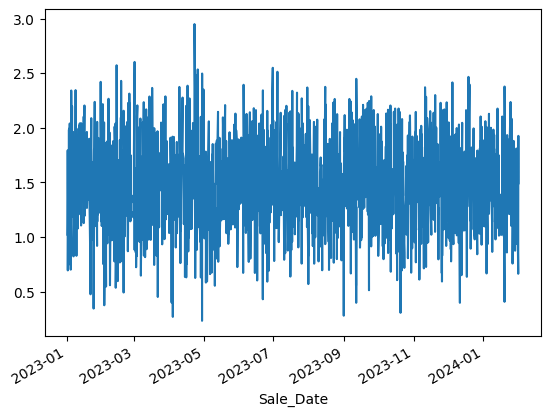

In [26]:
def convert_to_kg(row):
    if row['Product_Measure'] == 'кг':
        return row['Product_Amount']
    elif row['Product_Measure'] == 'г':
        return row['Product_Amount'] * 0.001  # Конвертация грамм в килограммы
    else:
        return row['Product_Amount']  # Предположим, что другие единицы измерения уже в килограммах

# Применение функции к каждой строке
df['Product_Amount_Kg'] = df.apply(convert_to_kg, axis=1)

start_date = '2023-01-01'
end_date = '2024-02-01'

# Отфильтруйте данные по заданному промежутку даты
filtered_data = df[(df['Sale_Date'] >= start_date) & (df['Sale_Date'] <= end_date)]


# Группировка продаж по дням и вычисление суммы проданных килограмм
daily_sales_kg = filtered_data.groupby('Sale_Date')['Product_Amount_Kg'].sum().rename('Daily_Sales_Kg')

daily_sales_kg.plot()

In [12]:
weekly_sales_kg

NameError: name 'weekly_sales_kg' is not defined

In [ ]:
df

In [ ]:
data.Product_Name.unique()


In [ ]:
df = data[(data.Region == "Ростов-на-Дону") & (data.Product_Name == "Огурцы маринованные")]

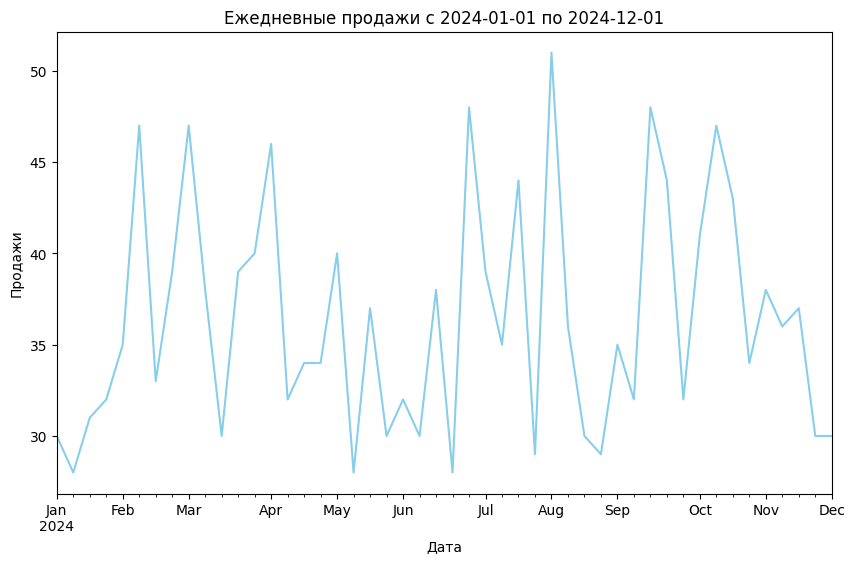

In [286]:
df['Sale_Date'] = pd.to_datetime(df['Sale_Date'])

# Задание начальной и конечной даты для промежутка
start_date = '2024-01-01'
end_date = '2024-12-01'

# Отфильтруйте данные по заданному промежутку даты
filtered_data = df[(df['Sale_Date'] >= start_date) & (df['Sale_Date'] <= end_date)]

# Группировка продаж по дням и вычисление суммы продаж для каждого дня
daily_sales = filtered_data.groupby(pd.Grouper(key='Sale_Date', freq='W')).size().rename('Daily_Sales')

# Построение графика ежедневных продаж
daily_sales.plot(kind='line', figsize=(10, 6), color='skyblue')

# Настройка меток оси x
plt.xlabel('Дата')
plt.ylabel('Продажи')
plt.title('Ежедневные продажи с {} по {}'.format(start_date, end_date))

# Отображение графика
plt.show()

In [ ]:
df['Sale_Date'] = pd.to_datetime(df['Sale_Date'])

# Функция для конвертации единиц измерения в килограммы
def convert_to_kg(row):
    if row['Product_Measure'] == 'кг':
        return row['Product_Amount']
    elif row['Product_Measure'] == 'г':
        return row['Product_Amount'] * 0.001  # Конвертация грамм в килограммы
    else:
        return row['Product_Amount']  # Предположим, что другие единицы измерения уже в килограммах

# Применение функции к каждой строке
df['Product_Amount_Kg'] = df.apply(convert_to_kg, axis=1)

# Задание начальной и конечной даты для промежутка
start_date = '2023-01-01'
end_date = '2024-01-01'

# Отфильтруйте данные по заданному промежутку даты
filtered_data = df[(df['Sale_Date'] >= start_date) & (df['Sale_Date'] <= end_date)]

# Группировка продаж по неделям и вычисление суммы проданных килограмм
weekly_sales_kg = filtered_data.resample('D', on='Sale_Date')['Product_Amount_Kg'].sum().rename('Weekly_Sales_Kg')

# Построение графика еженедельных продаж в килограммах
weekly_sales_kg.plot(kind='bar', figsize=(10, 6), color='skyblue')

# Настройка меток оси x
plt.xlabel('Неделя')
plt.ylabel('Продажи (кг)')
plt.title('Еженедельные продажи в килограммах с {} по {}'.format(start_date, end_date))

# Отображение графика
plt.show()

In [293]:
def get_df(region, product_name):
    df = data[(data.Region == region) & (data.Product_Name == product_name)]
    df['Sale_Date'] = pd.to_datetime(df['Sale_Date'])

# Функция для конвертации единиц измерения в килограммы
    def convert_to_kg(row):
        if row['Product_Measure'] == 'кг':
            return row['Product_Amount']
        elif row['Product_Measure'] == 'г':
            return row['Product_Amount'] * 0.001  # Конвертация грамм в килограммы
        else:
            return row['Product_Amount']  # Предположим, что другие единицы измерения уже в килограммах
    
    # Применение функции к каждой строке
    df['Product_Amount_Kg'] = df.apply(convert_to_kg, axis=1)
    
    # Задание начальной и конечной даты для промежутка
    start_date = '2023-04-20'
    end_date = '2024-04-20'
    
    # Отфильтруйте данные по заданному промежутку даты
    filtered_data = df[(df['Sale_Date'] >= start_date) & (df['Sale_Date'] <= end_date)]
    
    # Группировка продаж по неделям и вычисление суммы проданных килограмм
    weekly_sales_kg = filtered_data.resample('W-Mon', on='Sale_Date')['Product_Amount_Kg'].sum().rename('Weekly_Sales_Kg')

    df_ts = pd.DataFrame({"timestamp":weekly_sales_kg.index,
                  "target":weekly_sales_kg,
                  "segment":product_name}).reset_index(drop=True)
    
    return df_ts

In [358]:
df1 = get_df("Ростов-на-Дону", "Молоко") 

In [366]:
!python3 --version

Python 3.10.12


In [367]:

def get_remaining(data, start_date, end_date):
    data['Manufacture_Date'] = pd.to_datetime(data['Manufacture_Date'])
    data['Sale_Date'] = pd.to_datetime(data['Sale_Date'])
    
    # Создаем столбец с количеством произведенных продуктов для каждой даты
    manufactured_counts = data.groupby('Manufacture_Date').size().rename('Manufactured_Count')
    
    # Создаем столбец с количеством проданных продуктов для каждой даты
    sold_counts = data.groupby('Sale_Date').size().rename('Sold_Count')
    
    # Объединяем данные по датам
    result = pd.concat([manufactured_counts, sold_counts], axis=1).fillna(0)
    
    # Вычисляем количество продуктов на складе для каждой даты
    result['Remaining_Count'] = result['Manufactured_Count'].cumsum() - result['Sold_Count'].cumsum()
    
    # Задаем диапазон дат, которые вы хотите отобразить
    start_date = start_date
    end_date = end_date
    
    # Выбираем подмножество данных для заданного диапазона дат
    subset = result.loc[start_date:end_date]
    
    # Строим график для этого подмножества данных
    return subset.Remaining_Count

In [378]:
d.values

array([18325., 18324., 18325., ..., 18460., 18461., 18460.])

18918.0


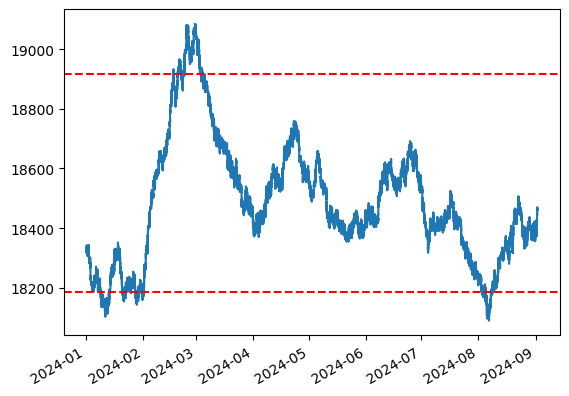

In [394]:
import numpy as np

d = get_remaining(data, "2024-01-01", "2024-09-01")

percentile_value = np.percentile(d.values, 95)
print(percentile_value)
# Построение графика
d.plot()

# Добавление горизонтальной линии на график
plt.axhline(y=np.percentile(d.values, 95), color='r', linestyle='--')
plt.axhline(y=np.percentile(d.values, 5), color='r', linestyle='--')

In [390]:
np.percentile(d.values, 100)

19085.0

In [294]:

df_ts = pd.DataFrame({"timestamp":[],
                  "target":[],
                  "segment":[]})
city = "Ростов-на-Дону"
for name in data.Product_Name.unique():
    df_new = get_df(city, name)
    df_ts = pd.concat([df_ts, df_new], ignore_index=True)
df_ts

,timestamp,target,segment
0,2023-04-24,27.4453,Сливочное масло
1,2023-05-01,45.6146,Сливочное масло
2,2023-05-08,49.6400,Сливочное масло
3,2023-05-15,42.6612,Сливочное масло
4,2023-05-22,36.7845,Сливочное масло
...,...,...,...
1055,2024-03-25,51.0000,Мед
1056,2024-04-01,41.3000,Мед
1057,2024-04-08,72.8000,Мед
1058,2024-04-15,35.7000,Мед


In [ ]:
concatenated_table = pd.concat([df1, df2], ignore_index=True)

# Вывод объединенной таблицы
print(concatenated_table)

In [ ]:
weekly_sales_kg

In [ ]:
df_ts = pd.DataFrame({"timestamp":weekly_sales_kg.index,
                  "target":weekly_sales_kg,
                  "segment":"main"}).reset_index(drop=True)
df_ts

In [30]:
from etna.datasets.tsdataset import TSDataset
from etna.transforms import LagTransform
from etna.transforms import LinearTrendTransform

In [295]:
ts = TSDataset(
    df=TSDataset.to_dataset(df_ts),
    freq="W-Mon"
)
ts

segment,Капуста,Картофель,Кефир,Куриное яйцо,Курица,Масло,Мед,Молоко,Морковь,Огурцы,Огурцы маринованные,Оливковое масло,Рис,Свекла,Свинина,Сливочное масло,Сыр,Творог,Хлеб,Яблоки
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2023-04-24,38.0358,289.3864,56.2,730.0,36.8857,51.0,25.5,72.29,22.2097,55.3779,51.65,33.4,84.7,47.2372,42.0946,27.4453,64.6803,38.75,49.20,30.2596
2023-05-01,74.1209,327.7655,122.7,1200.0,58.2366,120.0,39.9,108.01,53.4873,79.0214,45.95,44.9,87.1,50.8153,56.2563,45.6146,115.4408,42.85,63.45,57.6708
2023-05-08,48.4005,244.1884,106.5,950.0,44.0786,144.0,35.6,117.89,42.6040,82.8043,65.80,30.0,119.4,53.4958,66.6735,49.6400,91.4760,51.25,54.70,36.2331
2023-05-15,50.4813,438.2246,87.5,840.0,44.2489,102.2,61.6,141.67,59.2823,92.4154,58.75,36.5,109.7,49.7987,49.5436,42.6612,90.1336,33.20,56.70,44.6527
2023-05-22,59.4743,332.1129,69.6,1260.0,38.7692,87.0,56.8,112.34,39.1845,84.7535,61.60,25.2,97.0,54.5795,68.7333,36.7845,96.5688,34.90,49.40,63.1696
2023-05-29,41.3709,413.8337,94.1,930.0,50.4704,124.5,41.3,96.45,47.8892,99.1376,84.75,33.8,106.6,45.1872,52.9472,58.9517,98.0461,48.90,44.90,40.7294
2023-06-05,57.0167,260.5865,88.6,810.0,53.5182,113.1,40.7,114.60,67.7117,72.1406,60.25,36.0,92.1,42.0493,64.0256,53.2915,86.6150,49.90,49.85,66.4035
2023-06-12,48.7172,261.6696,106.7,1170.0,49.2486,119.6,33.1,115.12,52.8234,88.3027,82.05,36.7,117.1,51.4719,52.7197,40.3638,98.3024,49.55,66.55,47.1679


In [216]:
ts

segment,Капуста,Картофель,Кефир,Куриное яйцо,Курица,Масло,Мед,Молоко,Морковь,Огурцы,Огурцы маринованные,Оливковое масло,Рис,Свекла,Свинина,Сливочное масло,Сыр,Творог,Хлеб,Яблоки
feature,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,
2021-01-01,NaN,NaN,NaN,30.0,1.2324,NaN,NaN,2.79,NaN,5.1293,NaN,NaN,NaN,2.4115,9.6336,NaN,NaN,0.80,3.85,1.6555
2021-01-02,2.1445,NaN,6.5,0.0,3.4849,1.0,NaN,6.98,1.4712,5.0649,NaN,NaN,NaN,1.6275,6.1605,NaN,NaN,0.90,3.20,1.1035
2021-01-03,2.7926,20.0000,1.8,0.0,6.1417,0.0,0.4,34.48,1.8870,3.1220,NaN,NaN,NaN,6.8265,7.1337,1.3012,NaN,1.35,1.60,4.4120
2021-01-04,3.0246,1.0400,2.0,30.0,11.7239,1.8,0.0,15.85,2.6859,0.0000,NaN,NaN,1.8,5.0323,2.5452,1.7207,NaN,2.70,1.10,0.0000
2021-01-05,1.4691,0.0000,10.0,60.0,5.6348,0.0,0.0,10.73,2.3903,7.8389,NaN,1.0,0.0,3.1662,8.0955,0.0000,0.3000,0.00,3.00,2.5549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-15,10.8090,41.9937,24.3,290.0,7.5442,16.2,3.3,6.52,2.8527,11.4789,11.55,3.4,16.4,8.4267,7.7801,5.8430,14.5504,8.00,4.75,10.6696
2024-04-16,6.8770,52.6594,14.0,140.0,10.6027,0.0,6.9,25.16,6.4547,9.8191,4.90,1.0,29.5,9.4349,0.9387,10.7264,6.1853,6.10,7.15,8.0156


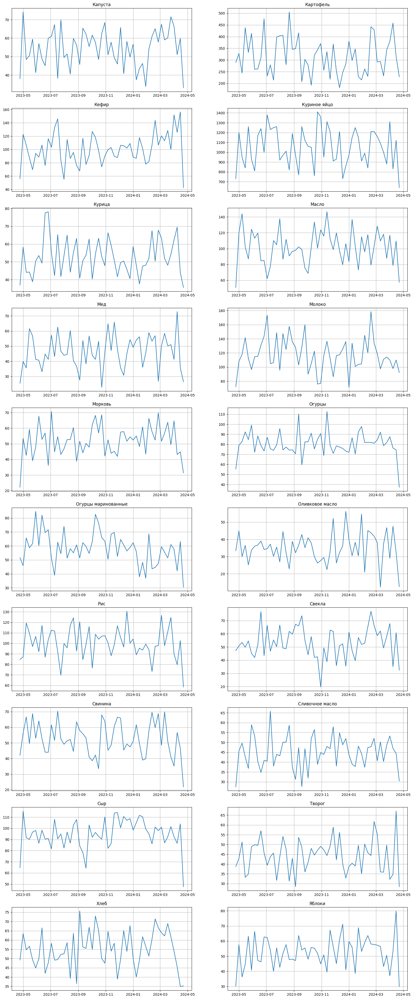

In [296]:
ts.plot(n_segments=20)

In [33]:
from etna.analysis import acf_plot
from etna.analysis import cross_corr_plot
from etna.analysis import distribution_plot
from etna.analysis import plot_correlation_matrix

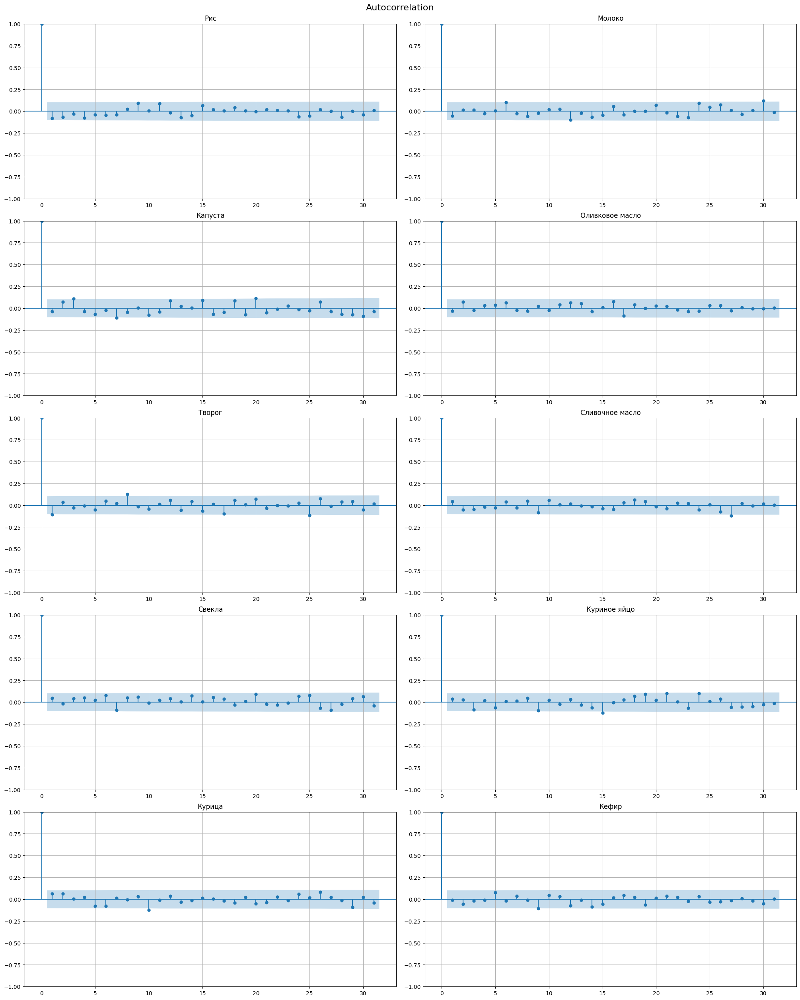

In [34]:
acf_plot(ts, lags=31)

In [35]:
from etna.analysis import plot_trend
from etna.analysis import plot_periodogram
from etna.analysis import seasonal_plot
from etna.analysis import stl_plot

In [128]:
trends = [
    LinearTrendTransform(in_column="target", poly_degree=1),
    LinearTrendTransform(in_column="target", poly_degree=2),
]

In [291]:
trends

[LinearTrendTransform(in_column = 'target', poly_degree = 1, ),
 LinearTrendTransform(in_column = 'target', poly_degree = 2, )]

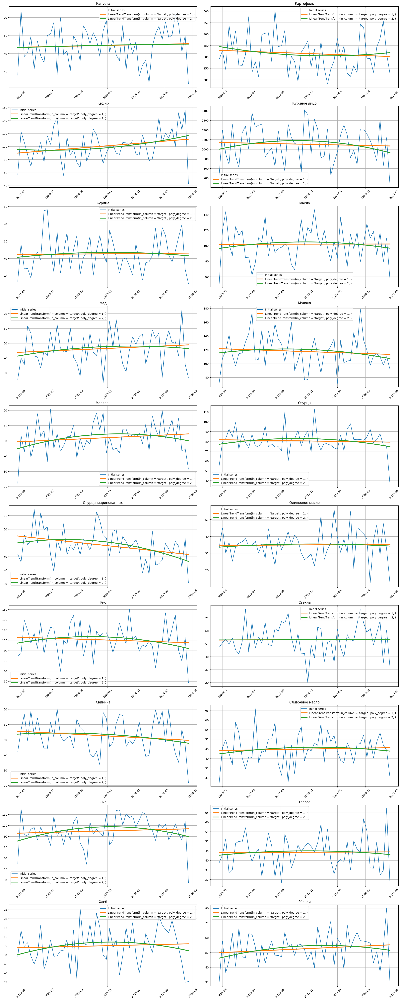

In [297]:
plot_trend(ts, trend_transform=trends)

In [317]:
trend_series = ts.
print(trend_series)

AttributeError: 'TSDataset' object has no attribute 'trend_series'

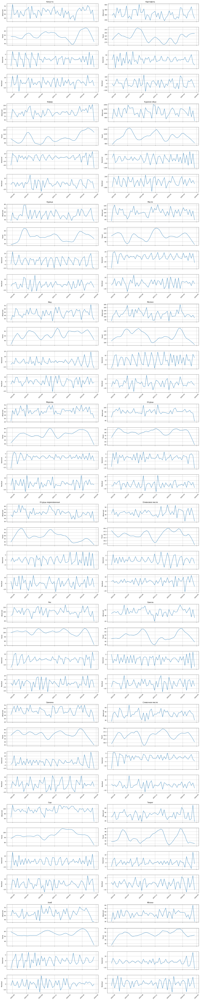

In [314]:
stl_plot(ts=ts, period=4)

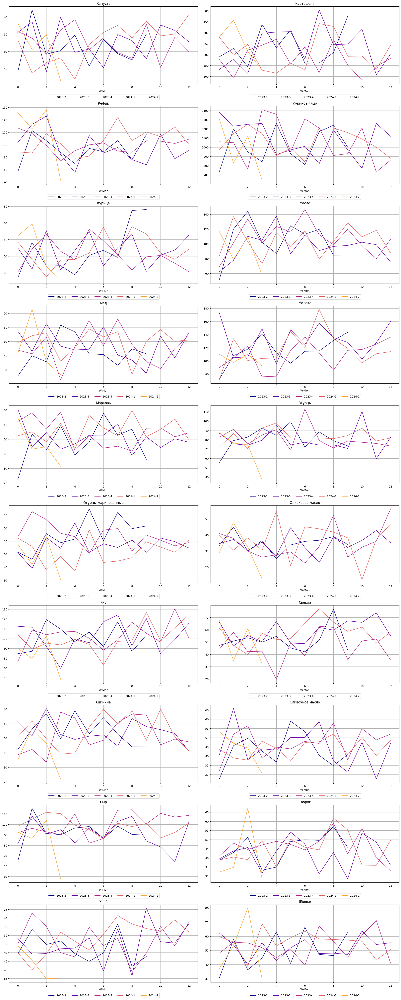

In [312]:
seasonal_plot(ts=ts, cycle="quarter")

In [298]:
HORIZON = 12

In [299]:
from etna.transforms import LagTransform

lags = LagTransform(in_column="target", lags=list(range(HORIZON, 40)), out_column="lag")

In [300]:
from etna.transforms import MeanTransform

mean = MeanTransform(in_column=f"lag_{HORIZON}", window=15)

In [301]:
from etna.transforms import DateFlagsTransform

date_flags = DateFlagsTransform(
    day_number_in_week=True,
    day_number_in_month=True,
    week_number_in_month=False,
    month_number_in_year=True,
    season_number=True,
    is_weekend=True,
    out_column="date_flag",
)

In [302]:
from etna.transforms import LogTransform

log = LogTransform(in_column="target", inplace=True)

In [357]:
ts

segment                                                                                                                                                                                                                                                                                              Капуста  \
feature    TrendTransform(in_column = 'target', change_points_model = RupturesChangePointsModel(change_points_model = <ruptures.detection.binseg.Binseg object at 0x762669950490>, n_bkps = 5, ), per_interval_model = SklearnRegressionPerIntervalModel(model = LinearRegression(), ), out_column = None, )   
timestamp                                                                                                                                                                                                                                                                                                      
2023-04-24                                          51.141545                                                                                                                                                                                                                                                  
2023-05-01                                          51.524978                                                                                                                                                                                                                                                  
2023-05-08                                          51.908411                                                                                                                                                                                                                                                  
2023-05-15                                          52.291844                                                                                                                                                                                                                                                  
2023-05-22                                          52.675276                                                                                                                                                                                                                                                  
2023-05-29                                          53.058709                                                                                                                                                                                                                                                  
2023-06-05                                          53.442142                                                                                                                                                                                                                                                  
2023-06-12                                          53.825575                                                                                                                                                                                                                                                  
2023-06-19                                          54.209007                                                                                                                                                                                                                                                  
2023-06-26                                          54.592440                                                                                                                                                                                                                                                  
2023-07-03                                      

<Axes: xlabel='timestamp'>

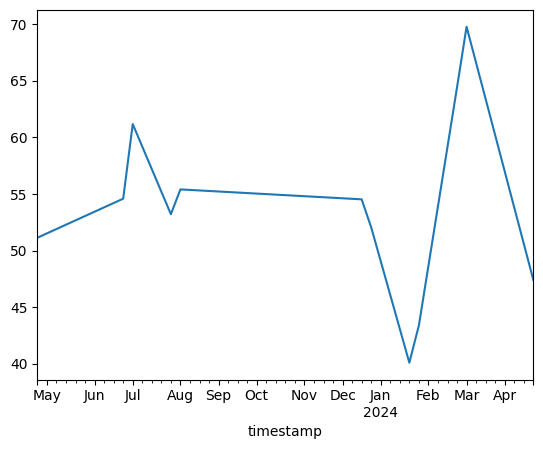

In [355]:
from etna.transforms import TrendTransform

trend = TrendTransform('target')
ans = trend.fit_transform(ts).to_pandas()["Капуста"].iloc[:, 0]
ans.plot()

In [309]:
train_ts, test_ts = ts.train_test_split(test_size=HORIZON)

In [218]:
segments4test = ["Воронеж_Капуста", "Воронеж_Картофель", "Воронеж_Кефир", "Воронеж_Куриное яйцо", 
                 "Воронеж_Курица", "Воронеж_Масло", "Воронеж_Мед"]

In [219]:
from etna.models import CatBoostMultiSegmentModel
from etna.pipeline import Pipeline
from etna.models import NaiveModel
from etna.transforms import LinearTrendTransform
from etna.transforms import SegmentEncoderTransform


trend = LinearTrendTransform(in_column="target", poly_degree=2)
seg = SegmentEncoderTransform()
# Define transforms
transforms = [lags, mean, date_flags, log, seg, trend]


model = CatBoostMultiSegmentModel()

# Define a pipeline
pipeline = Pipeline(model=model, transforms=transforms, horizon=HORIZON)


# Fit the pipeline
pipeline.fit(train_ts)

# Make a forecast
forecast_ts = pipeline.forecast()

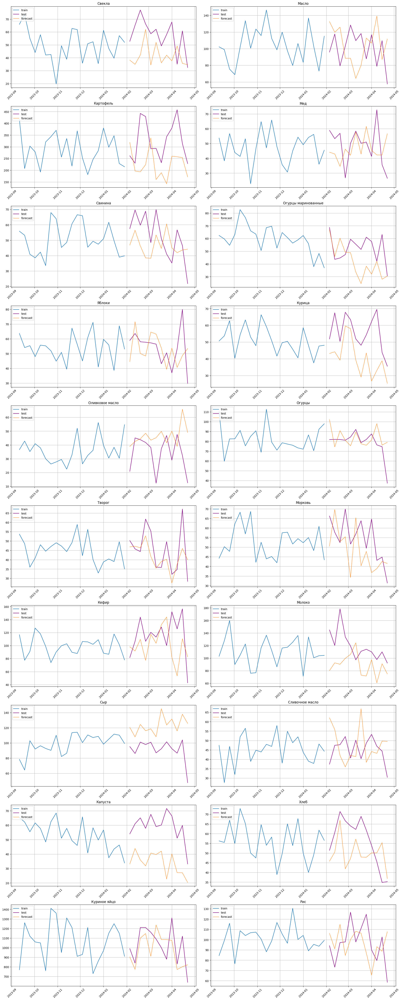

In [310]:
trend = LinearTrendTransform(in_column="target", poly_degree=2)
seg = SegmentEncoderTransform()
# Define transforms
transforms = [lags, mean, date_flags, log, seg, trend]

model = NaiveModel(lag=36)

# Define a pipeline
pipeline = Pipeline(model=model, horizon=HORIZON, transforms=transforms)

pipeline.fit(train_ts)

# Make a forecast
forecast_ts = pipeline.forecast()

plot_forecast(forecast_ts=forecast_ts, test_ts=test_ts, train_ts=train_ts, n_train_samples=21)

In [311]:
pipeline.save("Naive_pipeline.zip")
model.save("Naive_model.zip")

In [306]:
from etna.core import load

pipeline_loaded = load("Naive_pipeline.zip", ts=train_ts)

model = load("Naive_model.zip")

In [275]:
forecast_ts = pipeline_loaded.forecast()

In [276]:
forecast_ts.tra

segment                                                                                                                          Капуста  \
feature    MeanTransform(in_column = 'lag_7', window = 10, seasonality = 1, alpha = 1, min_periods = 1, fillna = 0, out_column = None, )   
timestamp                                                                                                                                  
2024-04-13                                            6.67606                                                                              
2024-04-14                                            6.79498                                                                              
2024-04-15                                            6.97158                                                                              
2024-04-16                                            7.78194                                                                              
2024-04-17                                            7.05741                                                                              
2024-04-18                                            7.54538                                                                              
2024-04-19                                            7.38253                                                                              

segment                                                                \
feature    date_flag_day_number_in_month date_flag_day_number_in_week   
timestamp                                                               
2024-04-13                            13                            5   
2024-04-14                            14                            6   
2024-04-15                            15                            0   
2024-04-16                            16                            1   
2024-04-17                            17                            2   
2024-04-18                            18                            3   
2024-04-19                            19                            4   

segment                                                         \
feature    date_flag_is_weekend date_flag_month_number_in_year   
timestamp                                                        
2024-04-13                 True                              4   
2024-04-14                 True                              4   
2024-04-15                False                              4   
2024-04-16                False                              4   
2024-04-17                False                              4   
2024-04-18                False                              4   
2024-04-19                False                              4   

segment                                                                 ...  \
feature    date_flag_season_number   lag_10   lag_11   lag_12   lag_13  ...   
timestamp                                                               ...   
2024-04-13                       2  12.6477   3.6698   9.7544   9.0751  ...   
2024-04-14                       2   3.9000  12.6477   3.6698   9.7544  ...   
2024-04-15                       2   1.4068   3.9000  12.6477   3.6698  ...   
2024-04-16                       2   9.7345   1.4068   3.9000  12.6477  ...   
2024-04-17                       2   6.2763   9.7345   1.4068   3.9000  ...   
2024-04-18                       2   9.1330   6.2763   9.7345   1.4068  ...   
2024-04-19                       2  12.2218   9.1330   6.2763   9.7345  ...   

segment      Яблоки                                                        \
feature      lag_25   lag_26   lag_27   lag_28   lag_29    lag_7    lag_8   
timestamp                                                                   
2024-04-13   4.5177   4.7376  10.8907   1.0715   8.7946  11.1745  15.1608   
2024-04-14   7.3435   4.5177   4.7376  10.8907   1.0715   5.5194  11.1745   
2024-04-15  17.8570   7.3435   

In [277]:
ts = TSDataset(
    df=TSDataset.to_dataset(df_ts),
    freq="D"
)
model.predict(ts, 7).to_pandas()["Капуста"]["target"]

timestamp
2024-04-13    13.6378
2024-04-14     6.8548
2024-04-15     8.6561
2024-04-16     9.9636
2024-04-17     6.2680
2024-04-18     5.0871
2024-04-19     7.3670
Freq: D, Name: target, dtype: float64

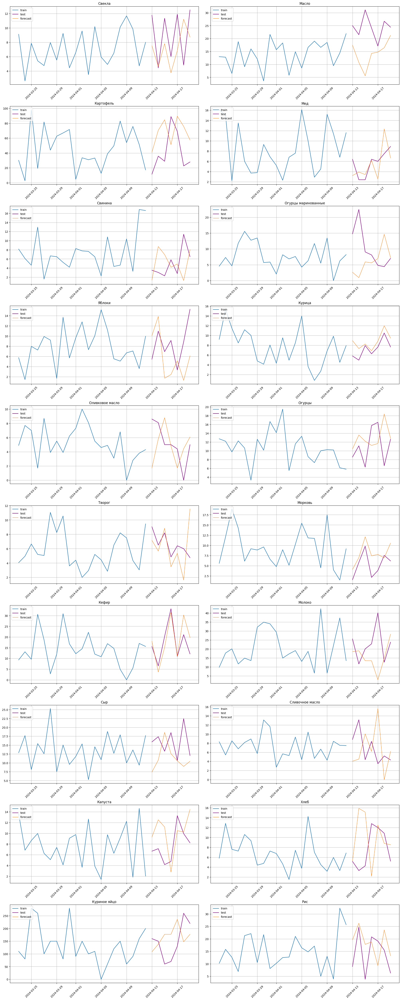

In [263]:
from etna.analysis import plot_forecast

plot_forecast(forecast_ts=forecast_ts, test_ts=test_ts, train_ts=train_ts, n_train_samples=21)

In [167]:
from etna.metrics import SMAPE

smape = SMAPE()

In [168]:
smape(y_true=test_ts, y_pred=forecast_ts)

{'Капуста': 28.891086057411453,
 'Картофель': 45.290783573010565,
 'Кефир': 47.48444360233467,
 'Куриное яйцо': 52.346004471395304,
 'Курица': 46.91363714472392,
 'Масло': 48.95881676297936,
 'Мед': 37.35631224966019,
 'Молоко': 55.12799718154976,
 'Морковь': 23.365263275998736,
 'Огурцы': 21.357564974909433,
 'Огурцы маринованные': 40.15460114243366,
 'Оливковое масло': 40.66350412226571,
 'Рис': 53.07634721554469,
 'Свекла': 28.11921368468711,
 'Свинина': 36.65275110956777,
 'Сливочное масло': 20.919964939777618,
 'Сыр': 38.70452978051379,
 'Творог': 30.928485299636694,
 'Хлеб': 25.02196829174073,
 'Яблоки': 16.85617248043659}

In [159]:
from etna.pipeline import AutoRegressivePipeline
from etna.analysis import plot_backtest
from etna.datasets import TSDataset
from etna.metrics import MAE
from etna.metrics import MAPE
from etna.metrics import SMAPE

In [160]:
transforms = [lags, mean, date_flags, log, seg, trend]


model = CatBoostMultiSegmentModel()

autoregressivepipeline = AutoRegressivePipeline(model=model, transforms=transforms, horizon=HORIZON, step=1)
metrics_recursive_df, forecast_recursive_df, _ = autoregressivepipeline.backtest(
    ts=ts, metrics=[SMAPE(), MAE(), MAPE()]
)
autoregressive_pipeline_metrics = metrics_recursive_df.mean()

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    7.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   21.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   28.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   34.9s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   34.9s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    9.6s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    9.6s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Do

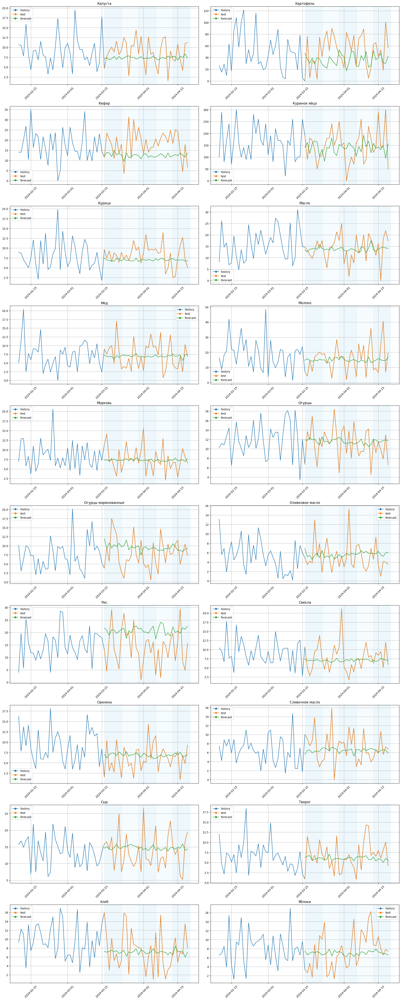

In [161]:
plot_backtest(forecast_recursive_df, ts, history_len=5 * HORIZON)